In [1]:
from IPython.display import display
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
import scipy as sy
import scipy.fftpack as syfp
import os
os.chdir("D:/TagUP/drive-download-20200801T213522Z-001")

In [2]:
from warnings import filterwarnings
filterwarnings("ignore")

## Analytical Approach

### Plotting the dataset
Using just the output from column 0 for now, then we can extrapolate it to rest of the columns as well

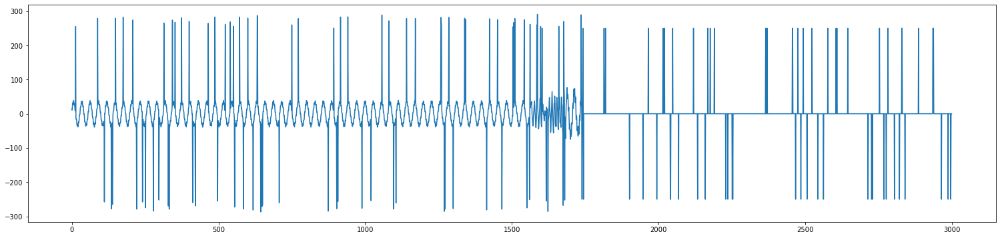

In [3]:
df = pd.read_csv("machine_1.csv", index_col=0)
plt.figure(figsize=(26,6))
plt.plot(range(len(df)), df['0'])
# plt.title(files)
plt.show()

Clearly data has a lot of noise, lets try to see what are the stats of this particular file

#### Thresholding using Stats

In [4]:
df['0'].describe()

count    3000.000000
mean        0.794507
std        61.216819
min      -287.162507
25%        -9.516317
50%         0.000763
75%         9.777863
max       290.676099
Name: 0, dtype: float64

(array([6.900e+01, 0.000e+00, 2.000e+00, 2.062e+03, 7.870e+02, 2.000e+00,
        0.000e+00, 7.800e+01]),
 array([-287.16250719, -214.93268142, -142.70285566,  -70.47302989,
           1.75679588,   73.98662165,  146.21644742,  218.44627319,
         290.67609896]),
 <a list of 8 Patch objects>)

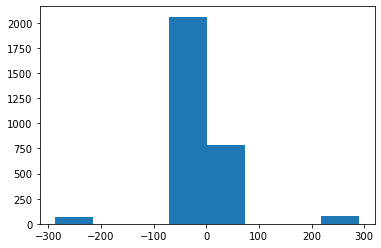

In [5]:
plt.hist(df['0'], bins=8)

Above graph and stats show that we have data mostly centered between -75 to 75 and very few outliers outside the specified range.
Thus, to clean the data, I can use the mean and standard deviation.
2 standard deviation will contain over 95% of the data, so I can ignore the rest 5% as noise and get the correct data.

In [6]:
df_without_outliers = df[abs(df['0']) < 2*(df['0'].mean() + (df['0'].std()))]

Now lets see the data by plotting it.

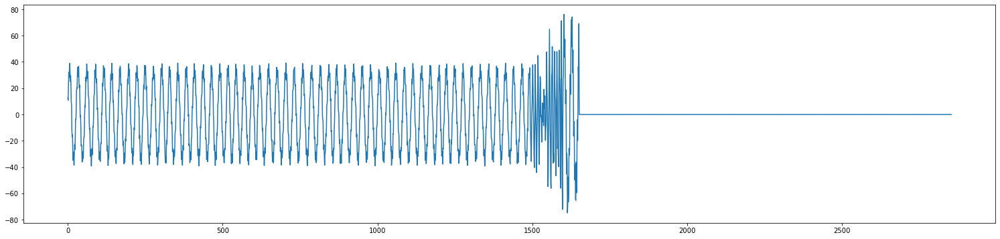

In [7]:
plt.figure(figsize=(26,6))
plt.plot(range(len(df_without_outliers)), df_without_outliers['0'])

Now the data looks way cleaner and we can easily distinguish between normal mode, faulty mode and dead mode.
Lets see this data with another perspective.

From the looks of the data, it seems that just before the data/sensor dies, we see the data to fluctuate, otherwise, the data looks pretty standard.

We can use histogram again to figure out how data is distributed. Based on it, we can observe when the data starts to crumble. If the graph crosses that threshold, we can say that the sensor has entered the faulty mode.

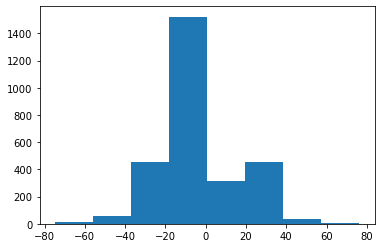

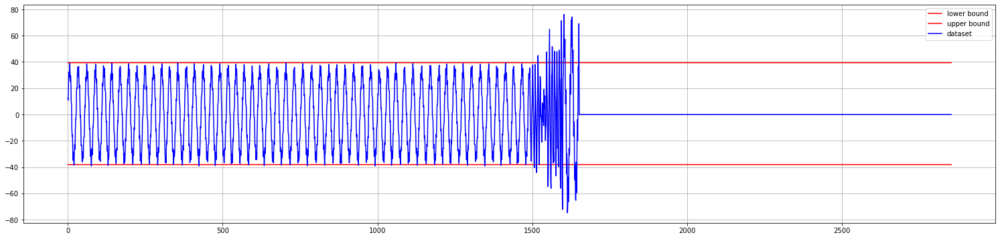

In [8]:
x = plt.hist(df_without_outliers['0'], bins=8)
lower_bound = [x[1][2] - 1 for _ in range(len(df_without_outliers))]
upper_bound = [x[1][6] + 1 for _ in range(len(df_without_outliers))]

plt.figure(figsize=(26,6))
plt.plot(range(len(df_without_outliers)), lower_bound, color='red', label='lower bound')
plt.plot(range(len(df_without_outliers)), upper_bound, color='red', label='upper bound')
plt.plot(range(len(df_without_outliers)), df_without_outliers['0'], color='blue', label='dataset')
plt.legend()
plt.grid()
plt.show()

Looks more visually appealing. From the looks of it, we can say that after 1500 timestamps, the data has crossed the threshold and entered into the faulty mode.

The threshold for identifying the data to be outlier can be set to 150, and for upper and lower bound at -40 to 40

Lets check if it holds the same for every dataset or not?

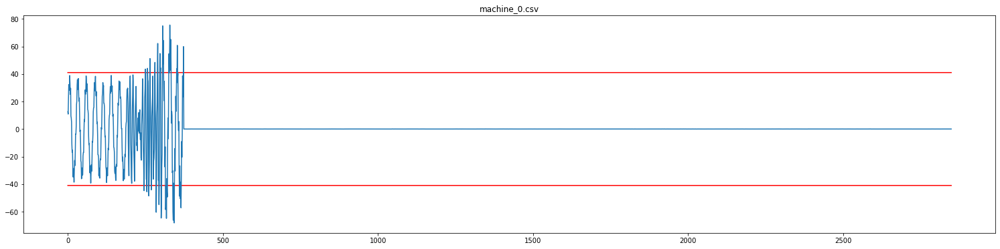

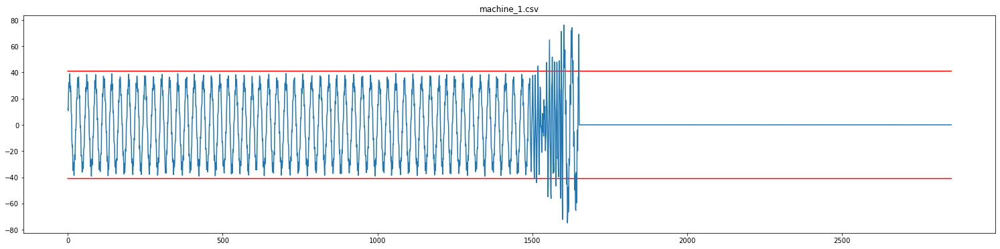

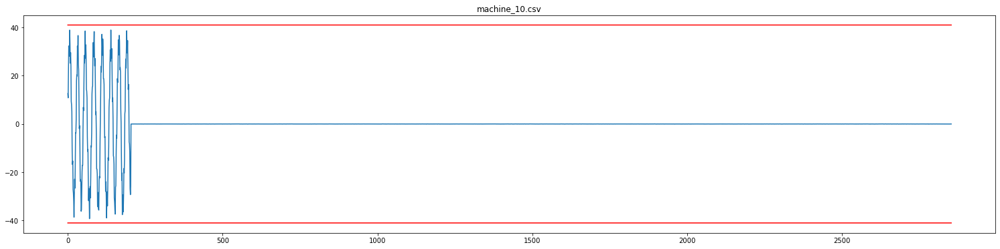

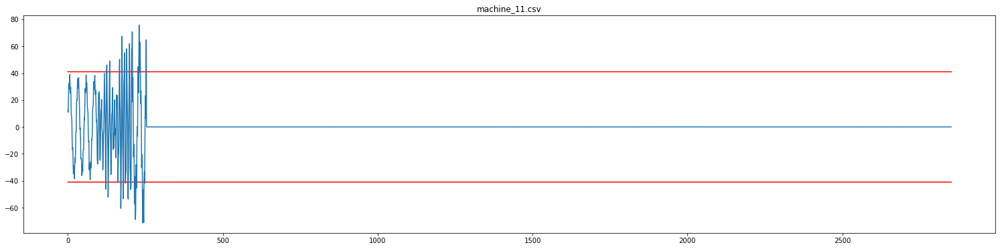

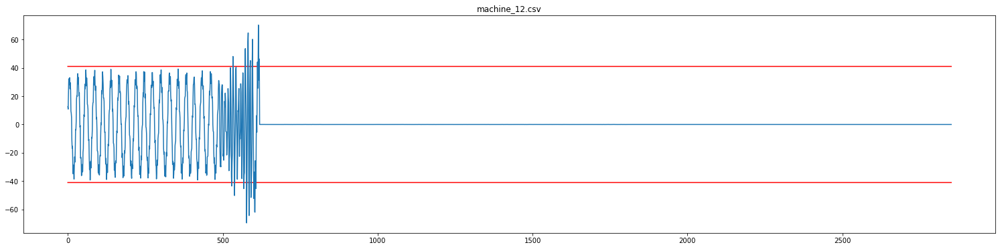

...

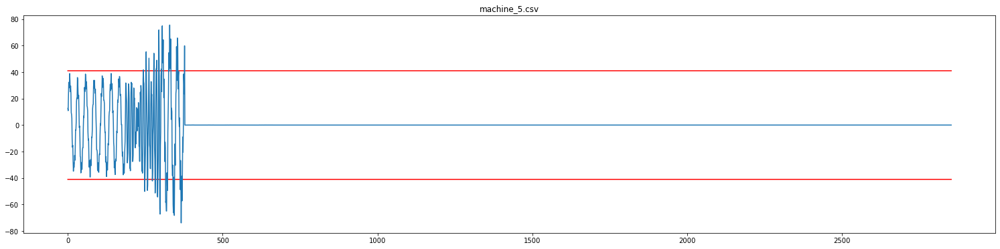

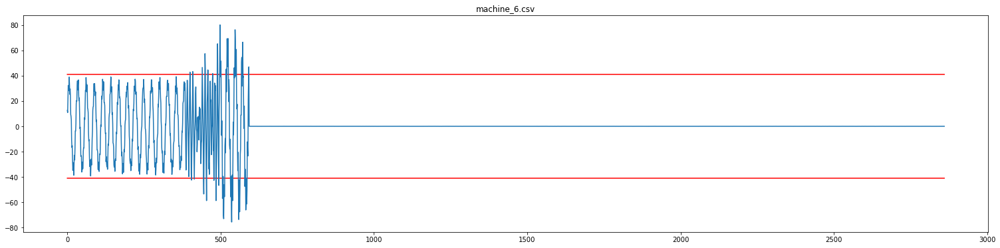

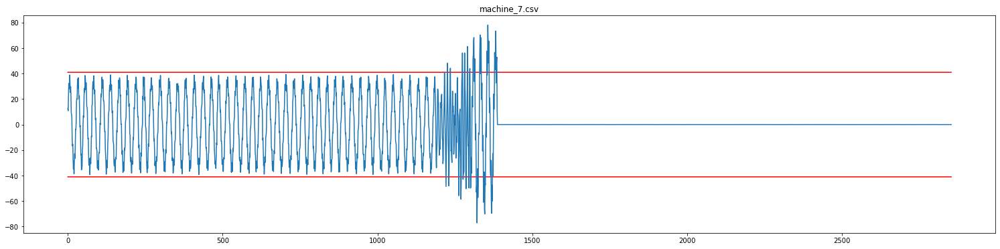

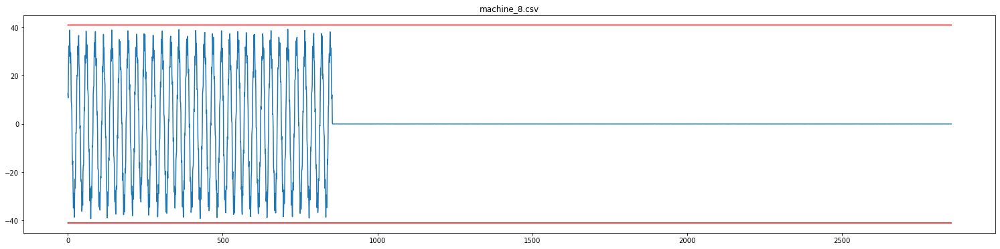

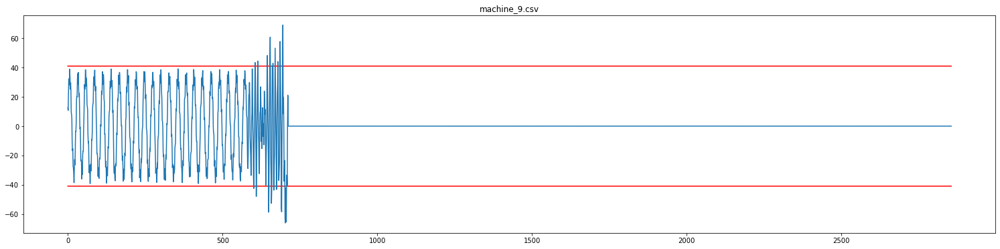

In [9]:
# data = []
for files in os.listdir():
    df1 = pd.read_csv(files, index_col=0)
    df1 = df1[abs(df1['0']) < 150]
#     x = plt.hist(df1['0'], bins=8)
    lower_bound = [-41 for _ in range(len(df1))]
    upper_bound = [41 for _ in range(len(df1))]

#     data.append(df1['0'])
    plt.figure(figsize=(26,6))
    plt.plot(range(len(df1)), lower_bound, color='red', label='lower bound')
    plt.plot(range(len(df1)), upper_bound, color='red', label='upper bound')
    plt.plot(range(len(df1)), df1['0'])
    plt.title(files)
    plt.show()

For most of the data, this looks close to accurate.
However, we can have another approach to it. Frequency domain method might help us. For most of the data, we can see that the frequency is more or less the same. As soon as it transitions to the faulty mode, the frequency of the data changes. We can keep a small window and check how the frequency of the dataset is changing. We should be seeng a major change in frequency while entering the faulty mode

#### Thresholding Using Frequency of the input data

In [10]:
window = 50

In [11]:
def freq_plot(df_without_outliers, window=50):
    ax = []
    for x in range(int(len(df_without_outliers)/window)):
        consider = round(df_without_outliers[window*x:window*(x+1)]['0'],1)
    #     print(consider)
        dt = 1
        freqs = syfp.fftfreq(len(consider), dt)
        FFT = sy.fft(consider)
        t = range(window*x, window*(x+1))
        plt.subplot(211)
        plt.plot(t, consider)
        plt.xlabel('Time')
        plt.ylabel('Amplitude')
        plt.subplot(212)
        ax1 = plt.plot(freqs, sy.log10(abs(FFT)), '--')  ## it's important to have the abs here
        ax.append(ax1)

        # plt.xlim(-.05, .05)
        ## zoom into see what's going on at the peak
        plt.grid()
        plt.show()
    return ax

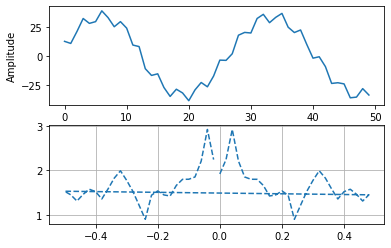

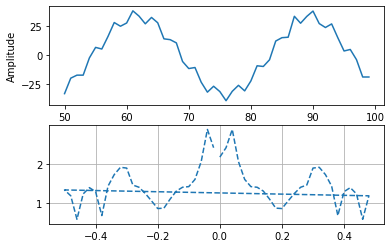

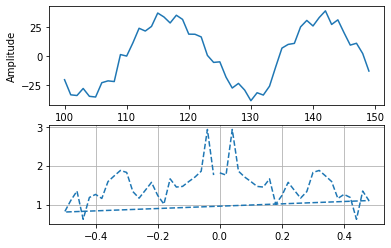

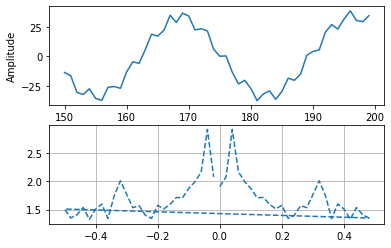

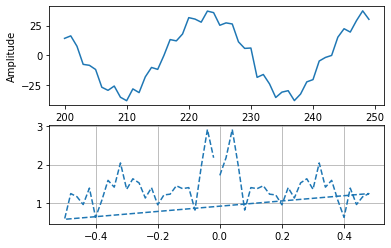

...

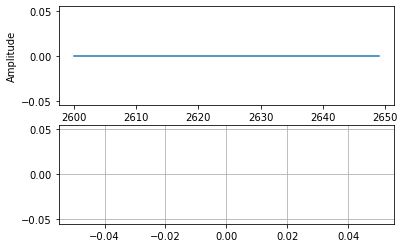

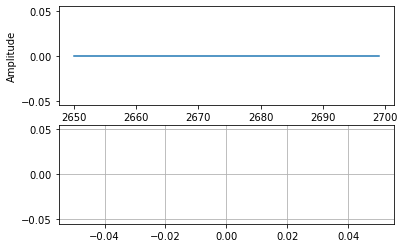

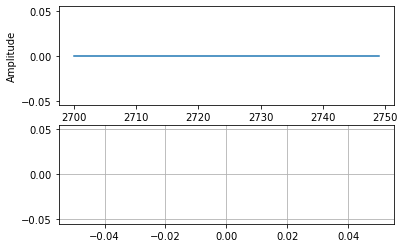

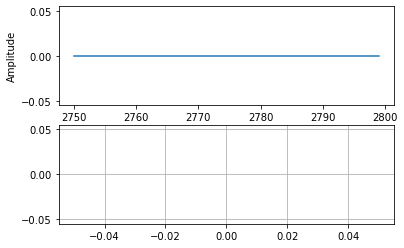

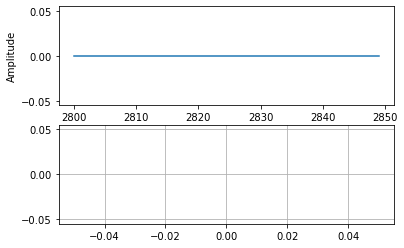

[[<matplotlib.lines.Line2D at 0x275843c17f0>],

In [12]:
freq_plot(df_without_outliers, window)

The two graphs above show the actual plot and the frequency of the specified range plotted with it.
For normal portion, we can see that the most prominent frequency is near 0 (very close to 0) (and obviously there are two prominent frequency). And the trend is observed up until the plot of 1500 to 1550. Visually we can see the jitter to begin and in the frequency plot below, we can see the prominent frequency to spread away from 0. Close to 0.2. We can safely say that the given set of data has more frequency and we can say that at this point the sensor has entered the faulty mode.

Lets see if it is true for other datasets as well.

In [13]:
test_df = pd.read_csv("machine_15.csv", index_col=0)
test_df_without_outliers = test_df[abs(test_df['0']) < 2*(test_df['0'].mean() + (test_df['0'].std()))]

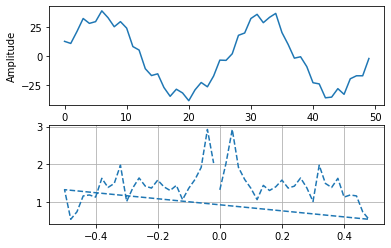

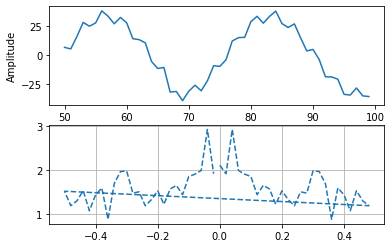

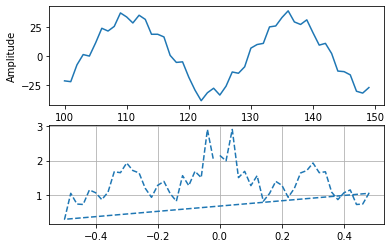

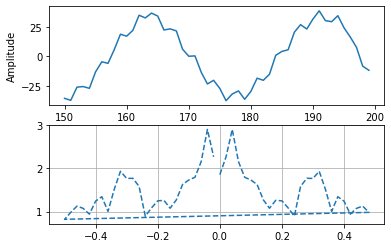

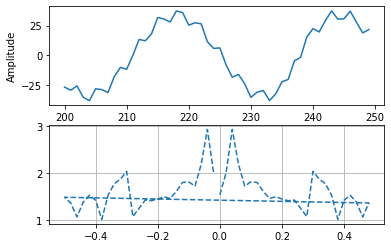

...

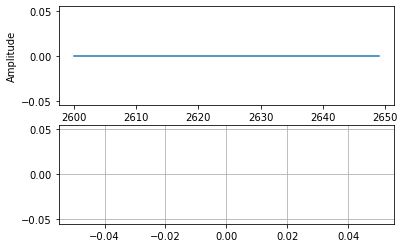

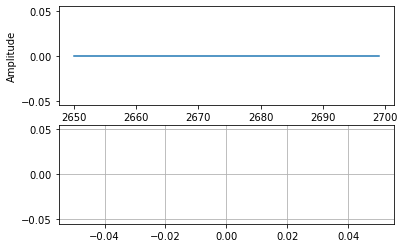

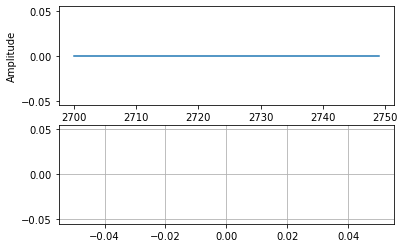

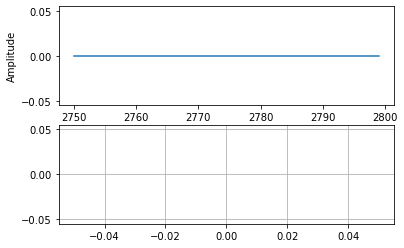

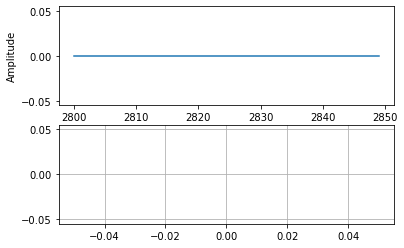

[[<matplotlib.lines.Line2D at 0x27589748940>],

In [14]:
freq_plot(test_df_without_outliers, window)

The hypothesis seems to be correct for this file as well, we can try for any other file as well, just run the below function and check for the change in prominent frequency

In [15]:
def run_frequency_plot(file_name, window=50):
    test_df = pd.read_csv(file_name, index_col=0)
    test_df_without_outliers = test_df[abs(test_df['0']) < 2*(test_df['0'].mean() + (test_df['0'].std()))]
    
    imp_points = freq_plot(test_df_without_outliers, window)
    return imp_points

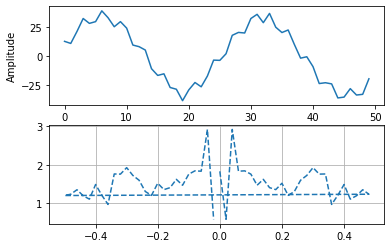

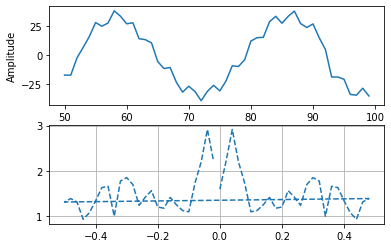

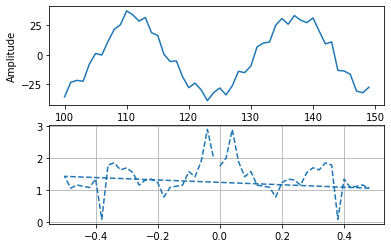

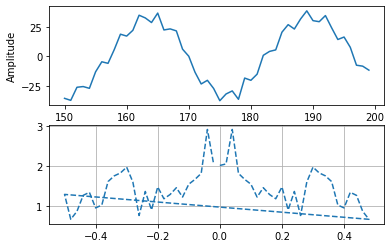

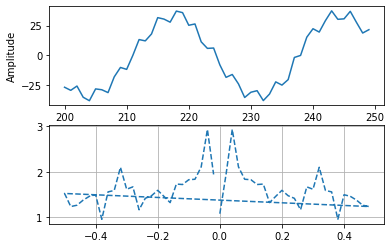

...

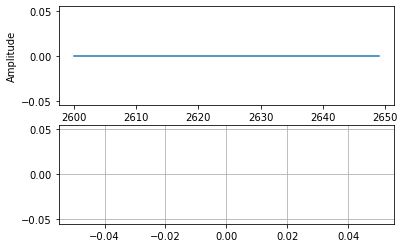

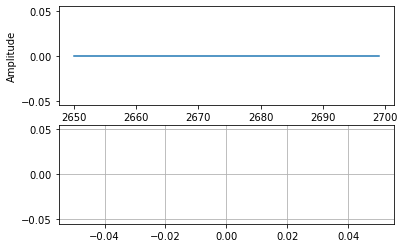

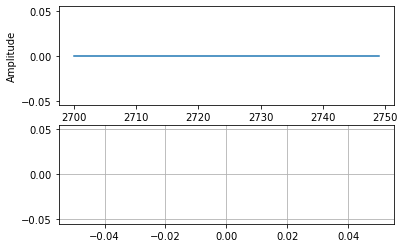

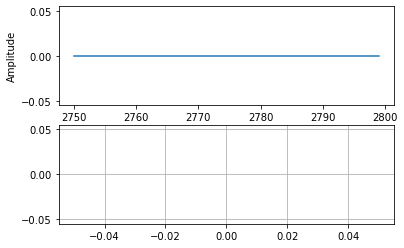

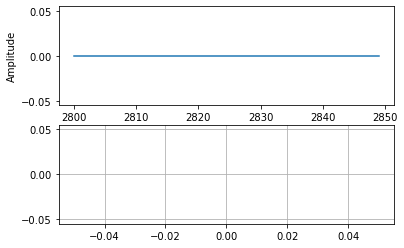

In [16]:
l = run_frequency_plot("machine_17.csv")

Now, lets write an autometed script to find the most prominent frequency

In [17]:
def find_anamoly(points, window, compare=None):
    prominent_freq_pos = list(points[0].get_ydata()).index(max(points[0].get_ydata()))
    print(prominent_freq_pos)
    if compare == None:
        return prominent_freq_pos
    
    if prominent_freq_pos == compare:
        print("Machine Operating in Normal Mode")
        return prominent_freq_pos
    
    elif (window - prominent_freq_pos) == compare:
        print("Machine Operating in Normal Mode")
        return prominent_freq_pos
    
    elif prominent_freq_pos != compare and (prominent_freq_pos + 1 != compare or prominent_freq_pos - 1 != compare
                                           or (window - prominent_freq_pos) - 1 != compare 
                                            or (window - prominent_freq_pos) + 1 != compare):
        print("MACHINE IN FAULTY MODE!!!")
        return False

In [18]:
compare = None
length = window
print(length)
for points in l:
    compare = find_anamoly(points, length, compare)
    if not compare:
        break

50
2
2
Machine Operating in Normal Mode
2
Machine Operating in Normal Mode
2
Machine Operating in Normal Mode
48
Machine Operating in Normal Mode
48
Machine Operating in Normal Mode
2
Machine Operating in Normal Mode
2
Machine Operating in Normal Mode
2
Machine Operating in Normal Mode
2
Machine Operating in Normal Mode
2
Machine Operating in Normal Mode
6
MACHINE IN FAULTY MODE!!!


We can figure out that the machine is in faulty mode by using two simple logics.
Finding the location of most prominent frequency. Since the frequency won't change for most of the cases (when operating in normal mode) the location won't change from that position.
Once we note a change in frequency (the location), we can say that the model is now in faulty mode.

Let's tie all this together!

In [19]:
def freq_plot(df_without_outliers, window=50, compare=None):
    ax = []
    for x in range(int(len(df_without_outliers)/window)):
        consider = round(df_without_outliers[window*x:window*(x+1)]['0'],1)
    #     print(consider)
        dt = 1
        freqs = syfp.fftfreq(len(consider), dt)
        FFT = sy.fft(consider)
        t = range(window*x, window*(x+1))
        plt.subplot(211)
        plt.plot(t, consider)
        plt.xlabel('Time')
        plt.ylabel('Amplitude')
        plt.subplot(212)
        ax1 = plt.plot(freqs, sy.log10(abs(FFT)), '--')  ## it's important to have the abs here
        compare = find_anamoly(ax1, window, compare)
        if not compare:
            return window*x, window*(x+1)
        ax.append(ax1)
        plt.grid()
        plt.show()
    return -1, -1

In [20]:
def run_frequency_plot(file_name, window=50, column='0'):
    test_df = pd.read_csv(file_name, index_col=0)
    test_df_without_outliers = test_df[abs(test_df[column]) < 2*(test_df[column].mean() + (test_df[column].std()))]
    plt.figure(figsize=(26,6))
    plt.plot(range(len(test_df_without_outliers)), test_df_without_outliers[column], color='blue', label='dataset')
    plt.grid()
    plt.show()    

    imp_points = freq_plot(test_df_without_outliers, window)
    return imp_points, test_df_without_outliers

In [21]:
def find_anamoly(points, window, compare=None):
    prominent_freq_pos = list(points[0].get_ydata()).index(max(points[0].get_ydata()))
    if compare == None:
        return prominent_freq_pos
    
    if prominent_freq_pos == compare:
        print("Machine Operating in Normal Mode")
        return prominent_freq_pos
    
    elif (window - prominent_freq_pos) == compare:
        print("Machine Operating in Normal Mode")
        return prominent_freq_pos
    
    elif prominent_freq_pos != compare and (prominent_freq_pos + 1 != compare or prominent_freq_pos - 1 != compare
                                           or (window - prominent_freq_pos) - 1 != compare 
                                            or (window - prominent_freq_pos) + 1 != compare):
        print("MACHINE IN FAULTY MODE!!!")
        return False

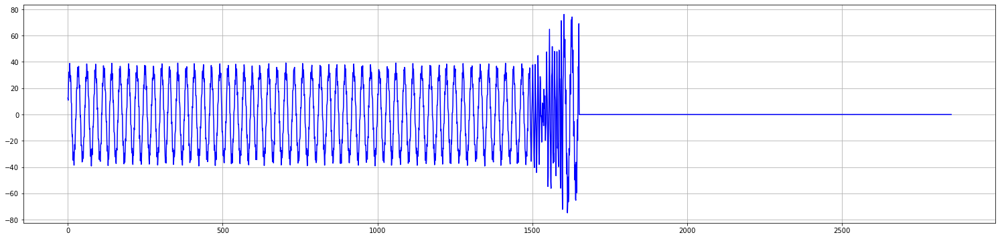

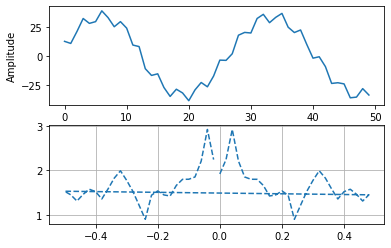

Machine Operating in Normal Mode


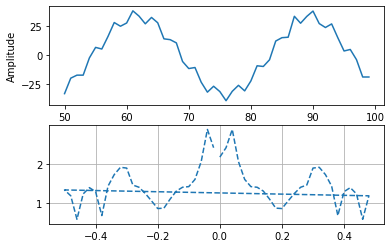

Machine Operating in Normal Mode


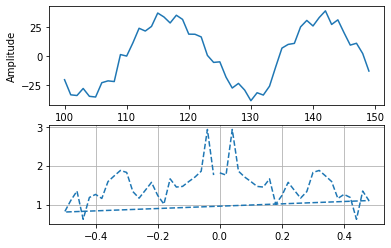

Machine Operating in Normal Mode


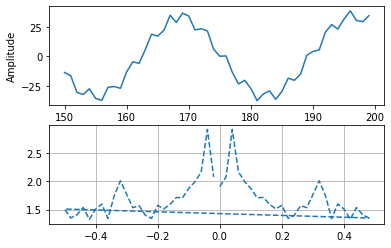

Machine Operating in Normal Mode


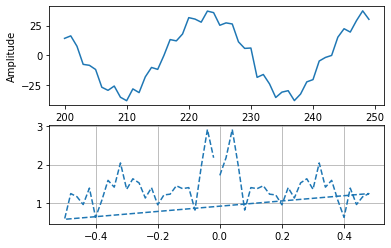

Machine Operating in Normal Mode


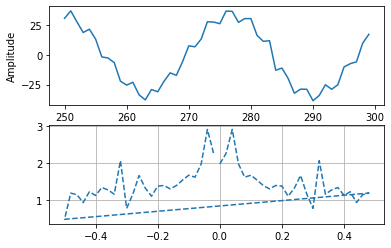

Machine Operating in Normal Mode


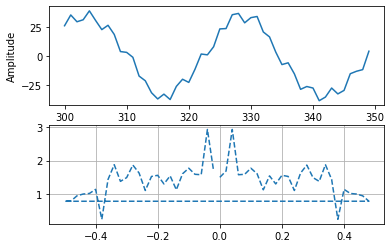

Machine Operating in Normal Mode


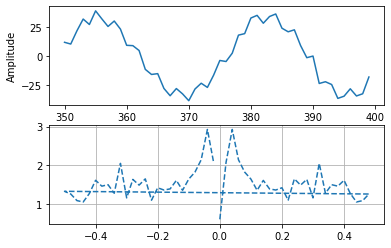

Machine Operating in Normal Mode


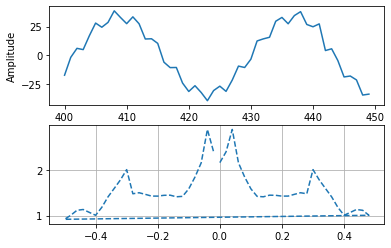

Machine Operating in Normal Mode


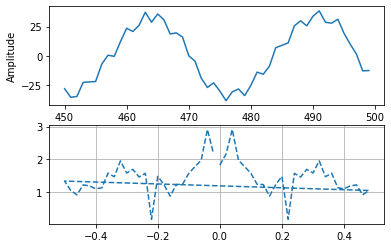

Machine Operating in Normal Mode


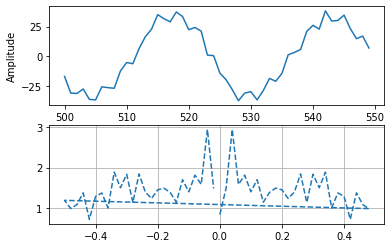

Machine Operating in Normal Mode


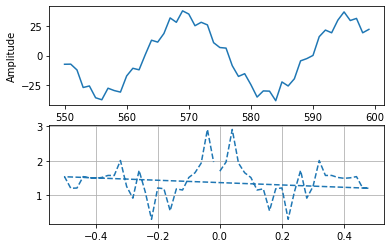

Machine Operating in Normal Mode


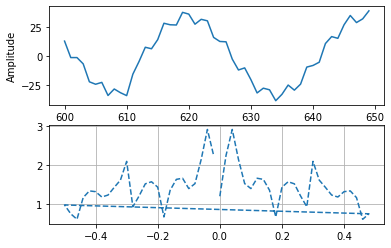

Machine Operating in Normal Mode


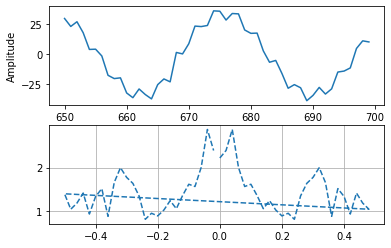

Machine Operating in Normal Mode


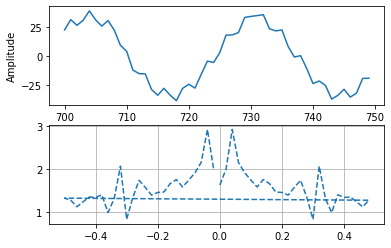

Machine Operating in Normal Mode


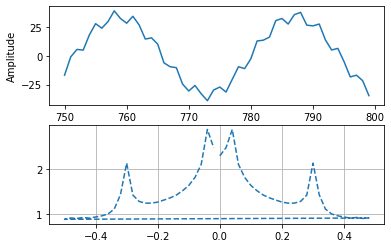

Machine Operating in Normal Mode


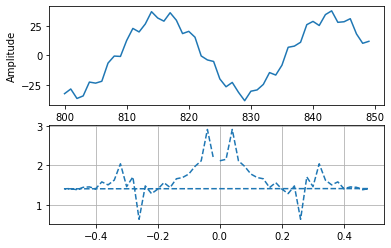

Machine Operating in Normal Mode


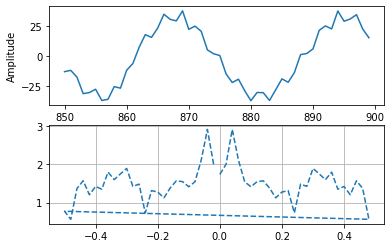

Machine Operating in Normal Mode


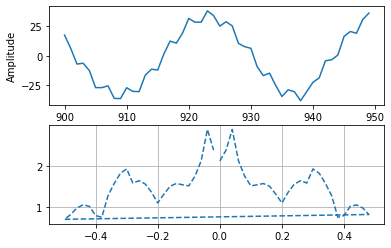

Machine Operating in Normal Mode


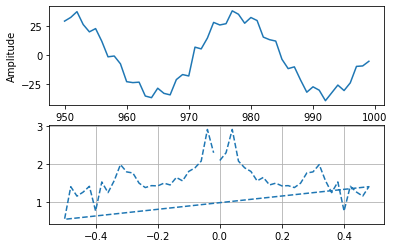

Machine Operating in Normal Mode


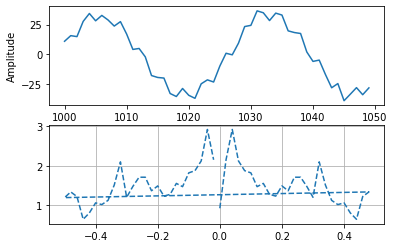

Machine Operating in Normal Mode


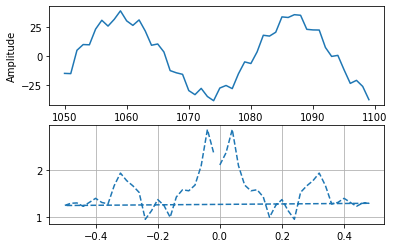

Machine Operating in Normal Mode


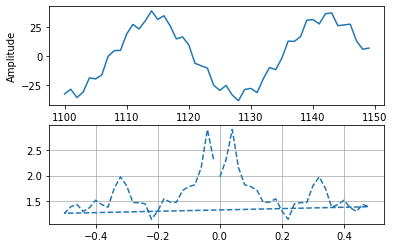

Machine Operating in Normal Mode


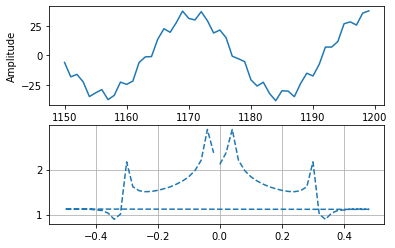

Machine Operating in Normal Mode


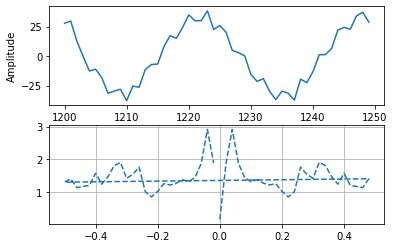

Machine Operating in Normal Mode


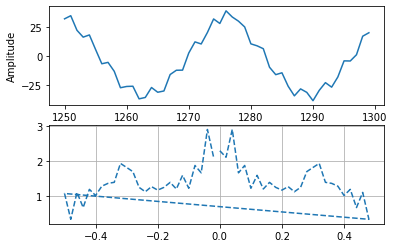

Machine Operating in Normal Mode


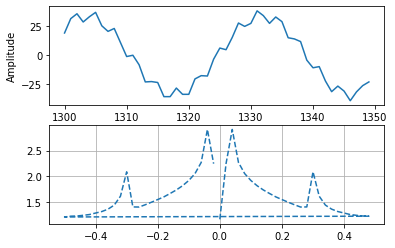

Machine Operating in Normal Mode


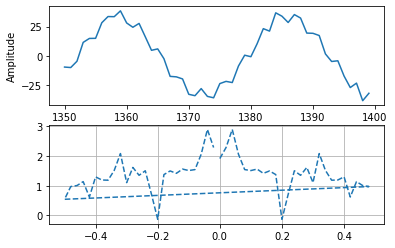

Machine Operating in Normal Mode


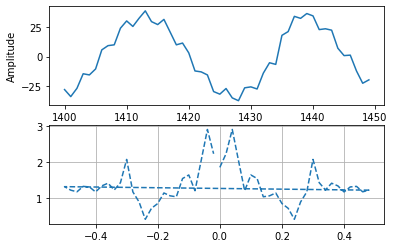

Machine Operating in Normal Mode


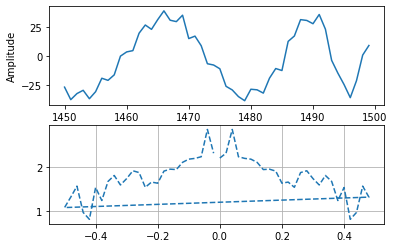

MACHINE IN FAULTY MODE!!!


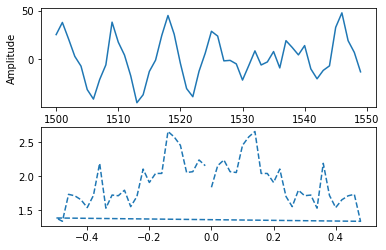

In [22]:
window = 50
column = '0'
ranger, _ = run_frequency_plot("machine_1.csv", window, column)

In [23]:
print(f'Machine enters Faulty mode in the range: {ranger}')

Machine enters Faulty mode in the range: (1500, 1550)


The above answer is in timestamps, so after 1500 timestamps, the machine enters the faulty mode!
We can decrease the range by controlling the width of window!

However, this cannot be entirely true, using this way, we can identify when the machine enters the faulty mode. To identify the dead mode, we have to wait for some time within the faulty mode. We can then use LSTM model to determine whe the machine will enter the dead mode, or how long before we can expect it to diminish to a zero point.

## Data Science Approach

Before we begin modelling, we should check if data is stationary or not.

ADFuller testing is one of the key tests to check if data is stationary or not

In [24]:
# !pip install statsmodels

#### Stationarity Test

In [25]:
def ad_test(df, column):
    from statsmodels.tsa.stattools import adfuller
    result = adfuller(df[column])
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')

    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))

In [26]:
ad_test(df_without_outliers, '0')

ADF Statistic: -16.748454
p-value: 0.000000
Critical Values:
	1%: -3.433
	5%: -2.863
	10%: -2.567


P-value signifies that we can successfully reject the null hypothesis, and the data is stationary. Thus time series can be applied on this dataset without any transformations.

Except for removing outliers, no more modification is required.

#### FBProphet

Prophet is open source software released by Facebook’s Core Data Science team. It is available for download on CRAN and PyPI.

Prophet follows the sklearn model API. We create an instance of the Prophet class and then call its fit and predict methods.

To install Fbprophet into our environment use the code below

In [27]:
# conda install -c conda-forge fbprophet

In [28]:
from fbprophet import Prophet

In [29]:
df_without_outliers

,0,1,2,3
2019-01-01 00:00:00.000000000,12.588243,8.829718,-11.803474,10.083107
2019-01-01 08:00:09.603201067,10.822199,2.795246,11.560279,21.898688
2019-01-01 16:00:19.206402134,21.074661,-0.655051,-17.840580,-1.346748
2019-01-02 00:00:28.809603201,32.284431,6.544655,-13.498907,-4.281704
2019-01-02 08:00:38.412804268,28.073949,253.681988,271.983917,263.627071
...,...,...,...,...
2021-09-25 07:59:11.983994672,-0.000396,0.018173,-0.000104,0.021436
2021-09-25 15:59:21.587195728,0.013339,-0.004840,0.008979,0.021192
2021-09-26 07:59:40.793597872,0.004022,-0.010029,-0.006909,-0.015833
2021-09-26 15:59:50.396798944,-0.000898,-0.011221,-0.003785,-0.010964


FBProphet works only when there are two columns and have their names as Y (target column) and DS (time column)

In [30]:
df_fb = df_without_outliers.reset_index()
df_fb = df_fb.rename(columns={'0': 'y', 'index':'ds'})

In [31]:
df_fb = df_fb[['ds', 'y']]

In [32]:
fb_function = Prophet(changepoint_prior_scale=0.01)
fb_function.fit(df_fb)

In [33]:
future = fb_function.make_future_dataframe(periods=365, freq='8h')
future.tail()

,ds
3213,2022-01-25 08:00:00
3214,2022-01-25 16:00:00
3215,2022-01-26 00:00:00
3216,2022-01-26 08:00:00
3217,2022-01-26 16:00:00


In [34]:
forecast = fb_function.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
3213,2022-01-25 08:00:00,-1.641315,-25.217296,23.013168
3214,2022-01-25 16:00:00,-1.658511,-26.261157,24.099666
3215,2022-01-26 00:00:00,-1.851231,-25.600086,22.306363
3216,2022-01-26 08:00:00,-2.445826,-27.710098,21.560312
3217,2022-01-26 16:00:00,-1.853380,-26.410239,23.839364


Let's see how does FBProphet works with Prediction on our dataset

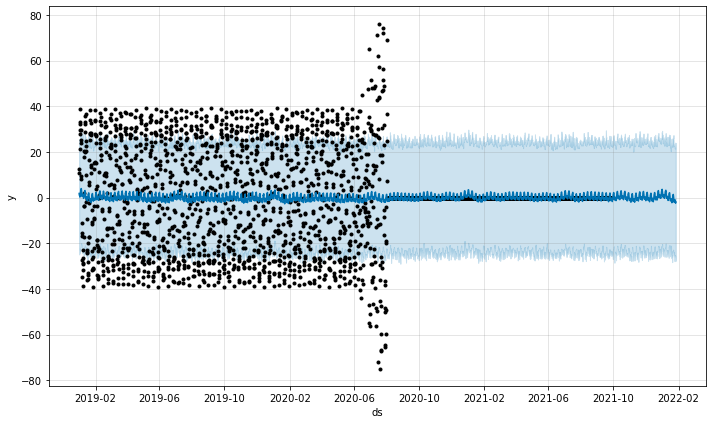

In [35]:
fig1 = fb_function.plot(forecast)

Not a lot of significance can be pulled out from the graph here, but looks like it is predicting it by aggregating all the hourly dataset into daily term and plotting them respectively.

Let's dive further into it

Lets se how our data works with weekly, yearly and daily seasonality

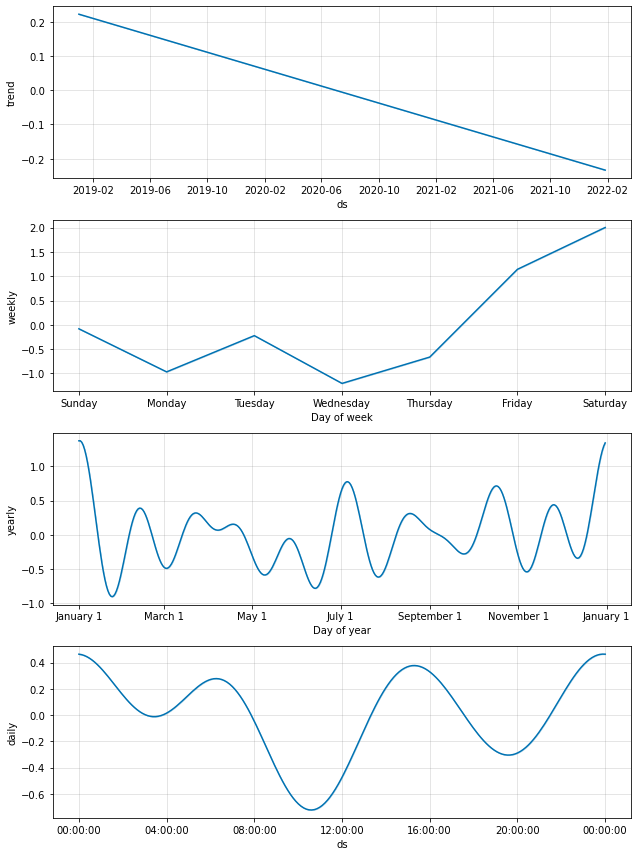

In [36]:
fig2 = fb_function.plot_components(forecast)

The overall trend goes down, which makes sense (as it eventually dies off).
The above graph gives us a more idea about the data. We can find anamoly using the above trends as well.
If the output dosn't coincide with the above trend then we can say that sensor has gone faulty and soon die.

Another intersting feature of FBProphet is the interactive graph it produces.
Lets have a look at that too.

In [37]:
from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

fig = plot_plotly(fb_function, forecast)  # This returns a plotly Figure
py.iplot(fig)

The FBprophet function is awesome and clearly quite easy to operate, the output it gives for hourly dataset is still up for debate.

From my personal experience, FBProphet can be very useful, but it always fell short when it come to hourly data.

#### LSTM

LSTM is a branch of Neural Network and Sequenctial Modelling. Helpful when it comes to Time Series Modelling

In [38]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import math
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import LeakyReLU
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from keras.layers.core import Dropout
import time
class LSTM_Model():

    def __init__(self, arguments):
        print(time.time())
        self.arguments = arguments
        
    def create_dataset(self, dataset, lookback=1):
        #inputs: A 3D tensor with shape [batch, timesteps, feature]

        dataX, dataY = [], []
        for i in range(len(dataset)-lookback):
            a = dataset[i:(i+lookback), 0]
            dataX.append(a)
            dataY.append(dataset[i + lookback, 0])
        return np.array(dataX), np.array(dataY)
   
    def reshape(self, dataset):
        return np.reshape(dataset, (dataset.shape[0], 1, dataset.shape[1]))
   
    def normalize(self, dataset, denormalize=False, scaler=None):
        if denormalize:
            return scaler.inverse_transform(dataset)
        scaler = MinMaxScaler(feature_range=(0, 1))
        dataset = scaler.fit_transform(dataset)
        return dataset, scaler
    
    def remove_outlier(self, dataset):
        print("Initializing Outlier functionality")
        range_value = dataset[self.arguments['target']].mean() + dataset[self.arguments['target']].std()
        dataset = dataset[abs(dataset[self.arguments['target']]) < range_value]
        
#         plt.figure(figsize=(26,6))
#         plt.plot(dataset[self.arguments['target']])
#         plt.title("Dataset without outliers")
        
        return dataset
        
    def read_file(self):
        print("Reading Dataset")
        dataset = pd.read_csv(self.arguments["data_path"], index_col=0)
        dataset = self.remove_outlier(dataset)
        dataset = dataset[self.start:self.subset]
        return dataset
    
    def split_dataset(self, dataset, ratio=0.8):
        print("Splitting dataset into training and testing")
        train_size = int(len(dataset) * ratio)
        train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
        return train, test, train_size
    
    def model_creation(self, features, output, test_features, test_output):
        print("Initiating LSTM")
        ac = LeakyReLU(alpha=0.3)
        model = Sequential()

        model.add(LSTM(8, activation=ac, input_shape=(1, self.arguments['lookback'])))
        model.add(Dropout(self.arguments['dropout']))
        model.add(Dense(1, activation='linear'))

        model.compile(loss='mse', optimizer='adam')
        model.fit(features, output, epochs=self.arguments['epochs'], batch_size=self.arguments['batch_size'],
                  validation_data=(test_features, test_output),
                  verbose=0)
        return model
    
    def rmse_error(self, set1, set2):
        score = math.sqrt(mean_squared_error(set1, set2))
        print('Score: %.2f RMSE:' %(score))
        return score
    
    def train_test_plot(self, dataset, scaler, trainPredict, testPredict, predicted_values):
        trainPredictPlot = np.empty_like(dataset)
        trainPredictPlot[:, :] = np.nan
        trainPredictPlot[self.arguments['lookback']:len(trainPredict)+
                         self.arguments['lookback'], :] = trainPredict
        
        # shift test predictions for plotting
        testPredictPlot = np.empty_like(dataset)
        testPredictPlot[:, :] = np.nan
        testPredictPlot[len(trainPredict)+(self.arguments['lookback']*2):len(dataset), :] = testPredict
        
        # plot baseline and predictions
        plt.figure(figsize=(10, 6))
        plt.title("LSTM Model")
        plt.plot(scaler.inverse_transform(dataset), label='Normal Dataset')
        plt.plot(trainPredictPlot, label='Train Prediction')
        plt.plot(testPredictPlot, label='Test Prediction')

        future_values = np.append(dataset, predicted_values)
        future_values = np.reshape(future_values, (-1,1))
        predicted_values = np.reshape(predicted_values, (-1,1))
        predicted_values = scaler.inverse_transform(predicted_values)
        
        
        actualPredictedPlot = np.empty_like(future_values)
        actualPredictedPlot[:, :] = np.nan

        actualPredictedPlot[len(dataset):len(dataset)+
                            self.arguments['prediction_steps'],:] = predicted_values

        plt.plot(actualPredictedPlot, label='Predicted Values')
        plt.legend()
        plt.grid()
        plt.show()
    
    def predictions(self, dataset):
        print("Preparing Predictions")
        preds = []
        model = self.arguments['lstm_model']
        for step in range(self.arguments['prediction_steps']):
            new_dataset, target = self.create_dataset(dataset, self.arguments['lookback'])
            new_dataset = self.reshape(new_dataset)
            latest_value = new_dataset[-1]
            latest_value = self.reshape(latest_value)
#            print(model.predict(latest_value)[0][0])
            preds.append(model.predict(latest_value)[0][0])
            dataset = np.append(dataset, [preds[-1]])
            dataset = np.reshape(dataset,(-1,1))
#            model = self.model_creation()
#        self.arguments['predicted_values'] = preds
        print("Predictions Done")
        return preds
        
    def calculate_aic(self, y, yhat):
        residual = yhat - y
        sum_square_erros = sum(residual**2)
        aic = ((2 * len(y)) - (2 * np.log(sum_square_erros)))
        return aic
        
    def target_restructred(self, dataset):
        print("Restructuring Target Values")
        target_values = dataset[self.arguments['target']].values
        target = target_values.reshape(-1,1)
        target_transformed, scaler = self.normalize(target)
        return target_transformed, scaler
    
    def main(self, subset, start=0, dataset=None):
        self.subset = subset
        self.start = start
#        np.random.seed(5)
        if dataset == None:
            dataset = self.read_file()
#        self.arguments['normalized_target'] = target_transformed
        target_transformed, self.arguments['scaler'] = self.target_restructred(dataset)
#         print(target_transformed)
        train, test, train_size = self.split_dataset(target_transformed, self.arguments['ratio_of_split'])
        
        trainX, trainY = self.create_dataset(train, self.arguments['lookback'])
        testX, testY = self.create_dataset(test, self.arguments['lookback'])
        
        
        trainX = self.reshape(trainX)
        testX = self.reshape(testX)
        
        
        model = self.model_creation(trainX, trainY, testX, testY)
        self.arguments['lstm_model'] = model
        
        
        trainPredict = model.predict(trainX)
        testPredict = model.predict(testX)
        

        self.arguments['train_prediction'] = trainPredict
        self.arguments['test_prediction'] = testPredict

        trainPredict = self.arguments['scaler'].inverse_transform(trainPredict)
        trainY = self.arguments['scaler'].inverse_transform([trainY])
        testPredict = self.arguments['scaler'].inverse_transform(testPredict)
        testY = self.arguments['scaler'].inverse_transform([testY])
        

        print('Train Score: %.2f RMSE' % (self.rmse_error(trainY[0], trainPredict[:,0])))
        print('Test Score: %.2f RMSE' % (self.rmse_error(testY[0], testPredict[:,0])))
        
        predicted_values = self.predictions(target_transformed) 
        self.arguments['predicted_values'] = predicted_values
#        print(predicted_values)
#        import csv
##        predicted_values.to_csv(self.arguments['run_dir']+'/out.csv')
#        with open(self.arguments['run_dir']+'/out.csv','wb') as result_file:
#            wr = csv.writer(result_file, dialect='excel')
#            wr.writerow(predicted_values)
        self.train_test_plot(target_transformed, self.arguments['scaler'], trainPredict, testPredict, predicted_values)        
        return (self.rmse_error(testY[0], testPredict[:,0])), (self.calculate_aic(testY[0], testPredict[:,0])), model


In [39]:
arguments = {
    'data_path' : "D:\\TagUP\\drive-download-20200801T213522Z-001\\machine_1.csv",
    'target' : '0',
    'prediction_steps' : 50,
    'lookback' : 48,
    'epochs' : 20,
    'dropout' : 0.2,
    'batch_size' : 64,
    'ratio_of_split' : 0.8
}

In [40]:
l = LSTM_Model(arguments)

1596564077.530885


Reading Dataset
Initializing Outlier functionality
Restructuring Target Values
Splitting dataset into training and testing
Initiating LSTM
Score: 7.11 RMSE:
Train Score: 7.11 RMSE
Score: 6.17 RMSE:
Test Score: 6.17 RMSE
Preparing Predictions
Predictions Done


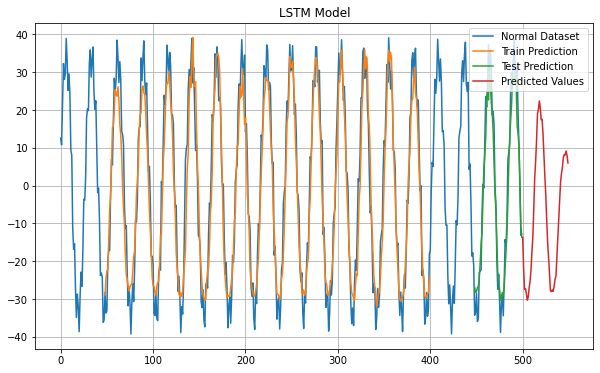

Score: 6.17 RMSE:


(6.167334352875579,
 88.82044571885992,
 <tensorflow.python.keras.engine.sequential.Sequential at 0x27592a909b0>)

In [41]:
l.main(500)

Train and Test RMSE are too close, so we can say that for the next 50 steps we can expect it to be accurate and so far the machine is not in faulty mode.

Reading Dataset
Initializing Outlier functionality
Restructuring Target Values
Splitting dataset into training and testing
Initiating LSTM
Score: 6.46 RMSE:
Train Score: 6.46 RMSE
Score: 5.96 RMSE:
Test Score: 5.96 RMSE
Preparing Predictions
Predictions Done


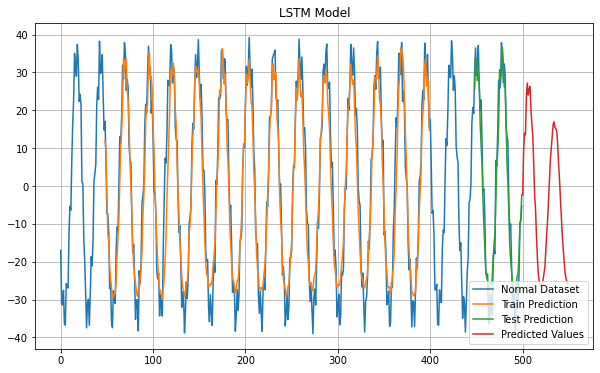

Score: 5.96 RMSE:


(5.9594205880481,
 88.95761952451335,
 <tensorflow.python.keras.engine.sequential.Sequential at 0x275a5779358>)

In [42]:
l.main(1000, 500)

Same case here, so we can say that up until 1000 timestamps we don't see any issues

Reading Dataset
Initializing Outlier functionality
Restructuring Target Values
Splitting dataset into training and testing
Initiating LSTM
Score: 7.64 RMSE:
Train Score: 7.64 RMSE
Score: 24.56 RMSE:
Test Score: 24.56 RMSE
Preparing Predictions
Predictions Done


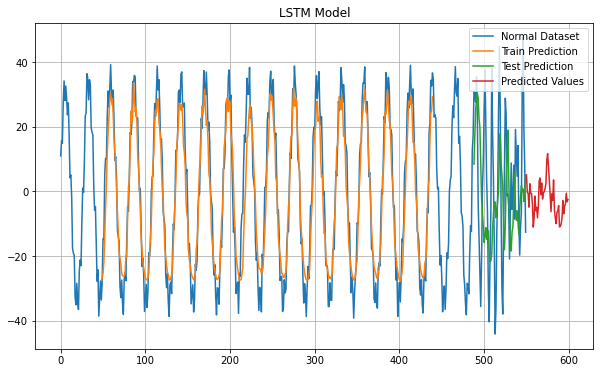

Score: 24.56 RMSE:


(24.55897488611753,
 102.94142177693685,
 <tensorflow.python.keras.engine.sequential.Sequential at 0x275a7cb5860>)

In [43]:
l.main(1550, 1000)

Here we can see that Train and Test RMSE are far from each other. So we can say that the sensor has entered into Faulty mode.

Using the same window technique, we can pinpoint when the machine enters the Faulty mode.

To find when the Machine will enter Faulty mode, we have to just find the time after 1500 timestamps.
It is easy when we use pandas date_range function to find the exact time after 1500 steps from the starting timestamp.

In [44]:
df_without_outliers.index[0]

'2019-01-01 00:00:00.000000000'

In [45]:
dates = pd.date_range(start=df_without_outliers.index[0], periods=1500, freq='8H')
print(dates[-1])

2020-05-14 16:00:00


So the fault mode begins somewhere around 4pm on 14th May 2020

#### Predicting When Dead Mode Starts

After thinking for sometime, I am using Analytical approach to determine when the machine will enter Dead Mode. I thought of multiple complex ideas, but sticking to occam's razor, I am using a traditional but a simpler approach.

Idea: Count the number of timestamps after which the Faulty sensor, dies.
It should be consistent across all dataset, we can check for it with testing on different datasets.

In [46]:
avg_0 = df_without_outliers.iloc[:,0].rolling(window=3).mean()

In [47]:
rounded_values = round(avg_0, 1)
rounded_values = np.array(rounded_values)
np.where(rounded_values == 0)[0]

array([1535, 1653, 1654, ..., 2850, 2851, 2852], dtype=int64)

The above are the indices at which point we can see no change in the output of sensor. Clearly, 1653, 1654 and so on... signify that at around 1653 instance, the sensor enters the dead mode. Since I used moving average technique to find the change in values of the senor by averaging the latest 3 values, the actual value at which the rangeof zero starts is 1653-3=1650th instance

This means that after 150 timestamps the sensor enters the dead mode.

But due to our window of 50, it can also mean that it could enter the dead mode anywhere between 150 to 200 timestamps after the first faulty mode is detected.

Let's test it on different datasets.

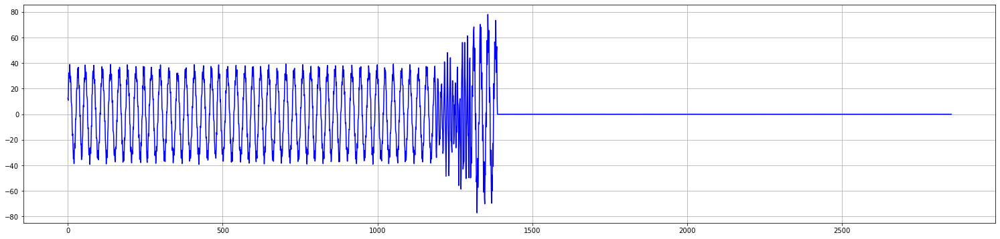

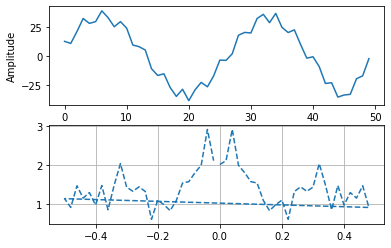

Machine Operating in Normal Mode


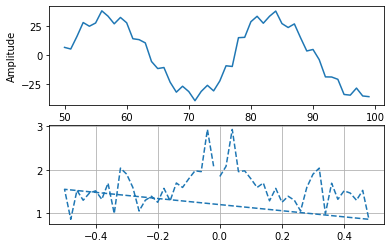

Machine Operating in Normal Mode


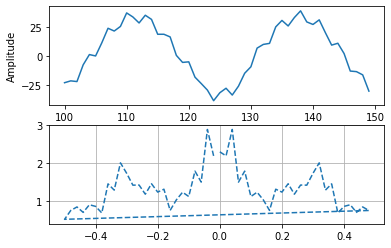

Machine Operating in Normal Mode


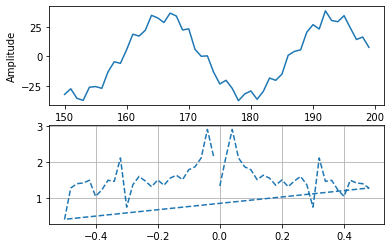

Machine Operating in Normal Mode


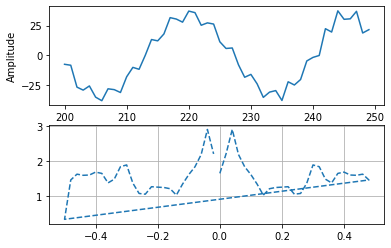

Machine Operating in Normal Mode


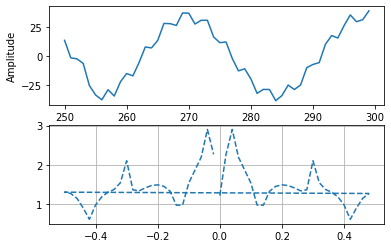

Machine Operating in Normal Mode


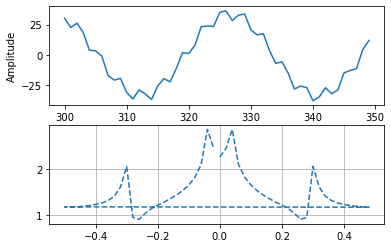

Machine Operating in Normal Mode


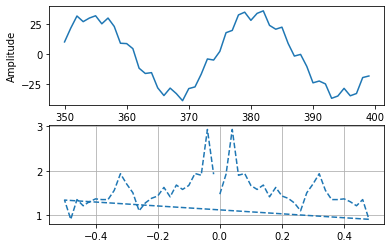

Machine Operating in Normal Mode


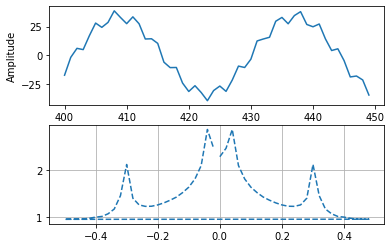

Machine Operating in Normal Mode


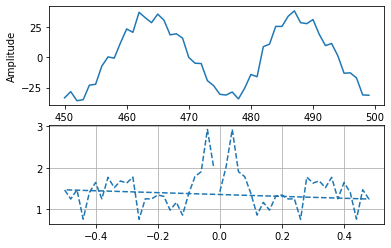

Machine Operating in Normal Mode


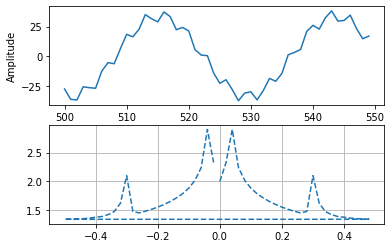

Machine Operating in Normal Mode


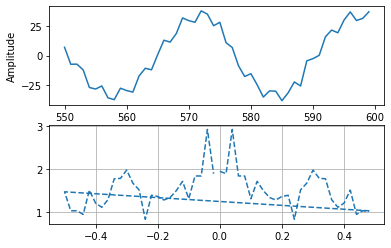

Machine Operating in Normal Mode


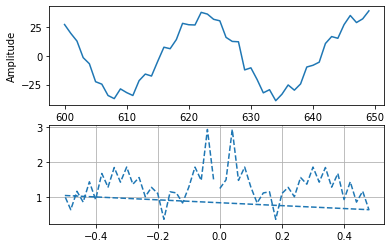

Machine Operating in Normal Mode


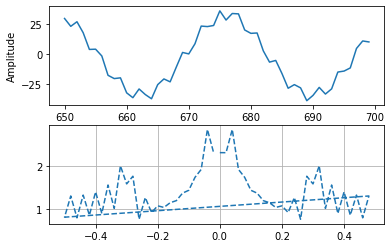

Machine Operating in Normal Mode


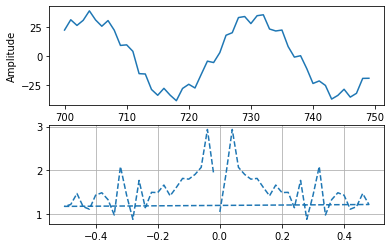

Machine Operating in Normal Mode


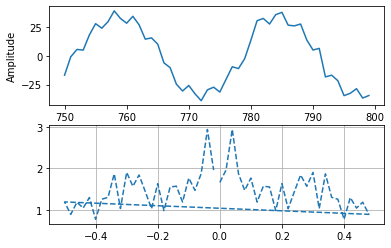

Machine Operating in Normal Mode


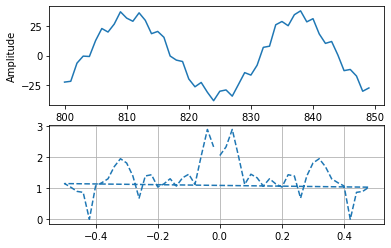

Machine Operating in Normal Mode


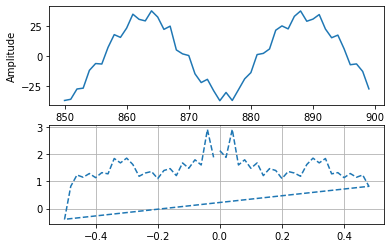

Machine Operating in Normal Mode


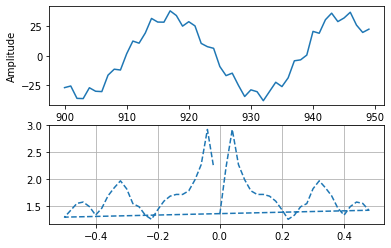

Machine Operating in Normal Mode


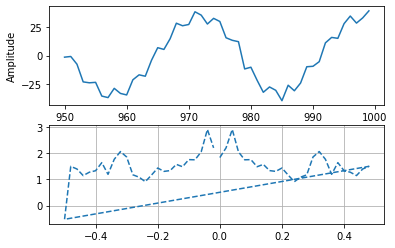

Machine Operating in Normal Mode


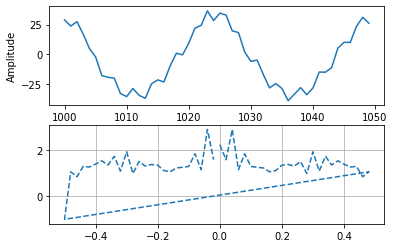

Machine Operating in Normal Mode


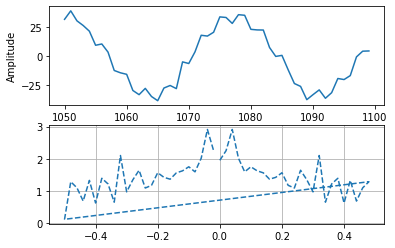

Machine Operating in Normal Mode


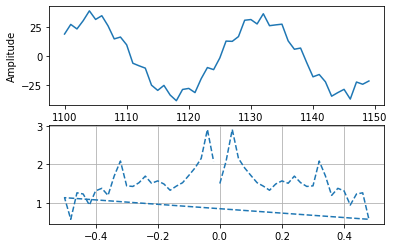

Machine Operating in Normal Mode


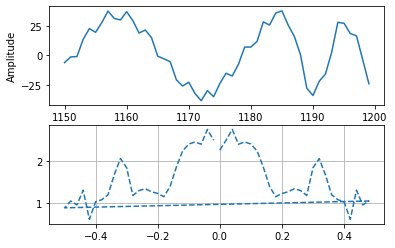

MACHINE IN FAULTY MODE!!!


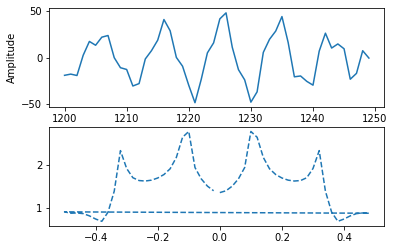

In [48]:
window = 50
column = '0'
ranger = run_frequency_plot("machine_7.csv", window, column)

In [49]:
print(f'Machine enters Faulty mode in the range: {ranger[0]}')

Machine enters Faulty mode in the range: (1200, 1250)


In [50]:
avg_0 = ranger[1].iloc[:,0].rolling(window=3).mean()
rounded_values = round(avg_0, 1)
rounded_values = np.array(rounded_values)
np.where(rounded_values == 0)[0]

array([1317, 1389, 1390, ..., 2850, 2851, 2852], dtype=int64)

From the above result, we can see the sequence of Zeros, start after 1389th instance, meaning Sensor dies after 1386th instance. Given that the range of fault began from 1200, sensor dies after. Thus time taken for the sensor to die after it was in faulty mode is 189 timestamps, which is within the range we predicted.

Thus, extrapolating results for column '0', we can say that after 150 timestamps, the sensor can die. Essentially meaning, once the sensor is in faulty mode, it has 1200 hours before it goes dead.

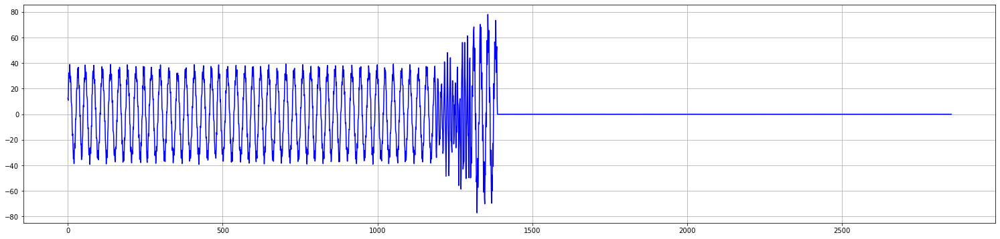

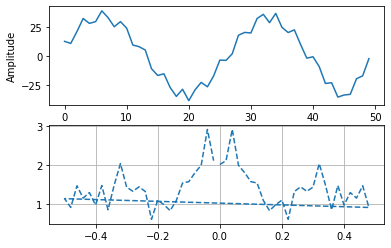

Machine Operating in Normal Mode


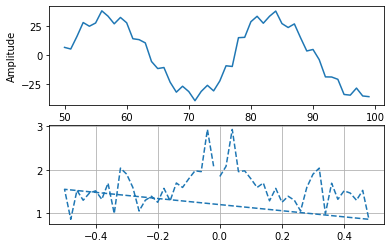

Machine Operating in Normal Mode


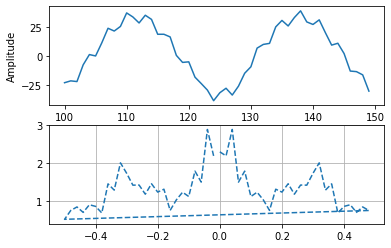

Machine Operating in Normal Mode


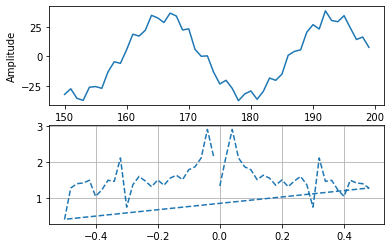

Machine Operating in Normal Mode


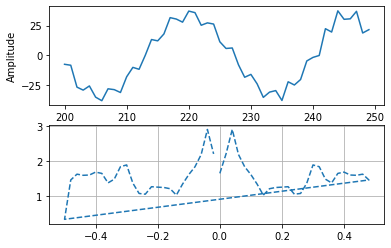

Machine Operating in Normal Mode


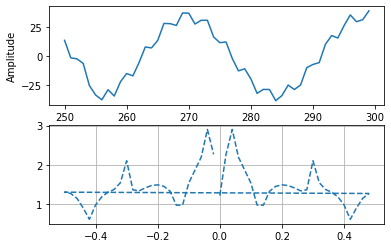

Machine Operating in Normal Mode


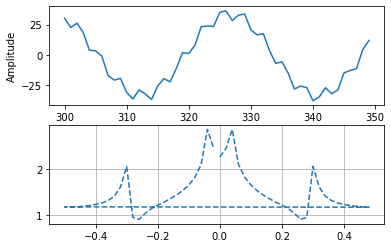

Machine Operating in Normal Mode


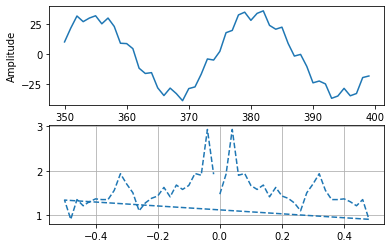

Machine Operating in Normal Mode


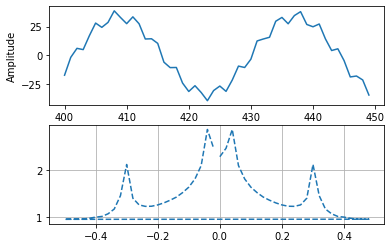

Machine Operating in Normal Mode


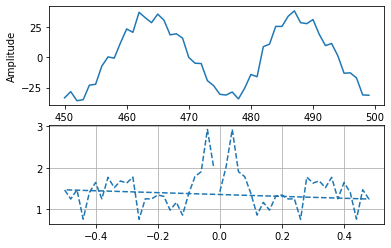

Machine Operating in Normal Mode


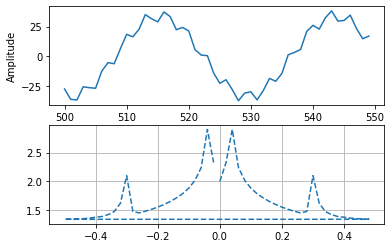

Machine Operating in Normal Mode


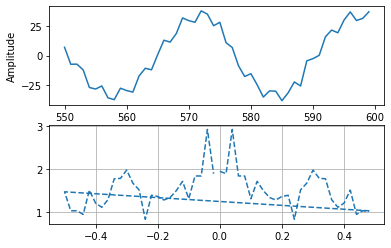

Machine Operating in Normal Mode


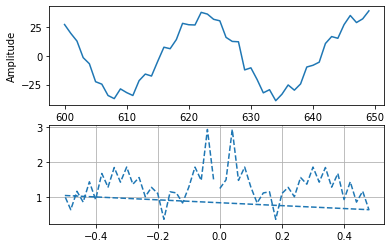

Machine Operating in Normal Mode


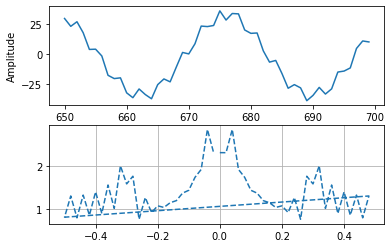

Machine Operating in Normal Mode


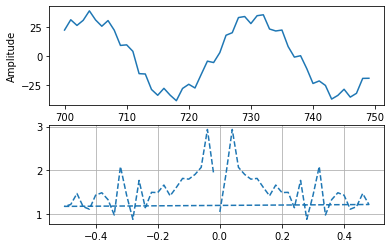

Machine Operating in Normal Mode


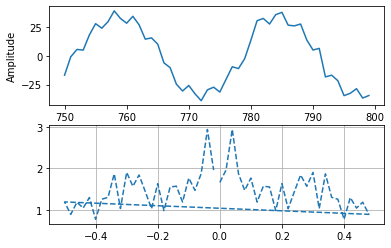

Machine Operating in Normal Mode


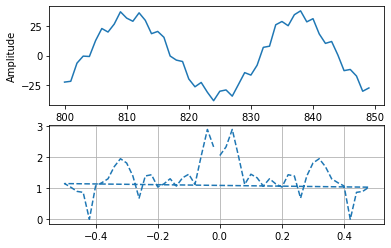

Machine Operating in Normal Mode


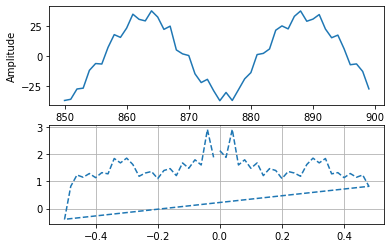

Machine Operating in Normal Mode


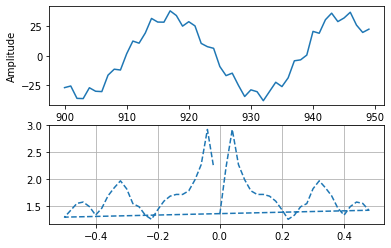

Machine Operating in Normal Mode


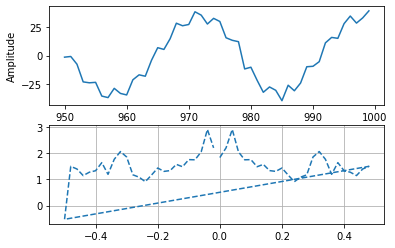

Machine Operating in Normal Mode


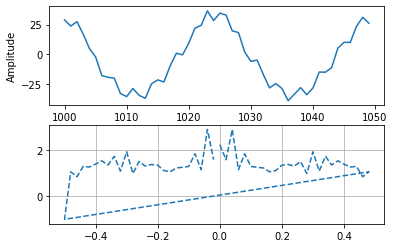

Machine Operating in Normal Mode


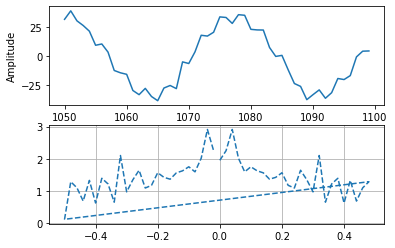

Machine Operating in Normal Mode


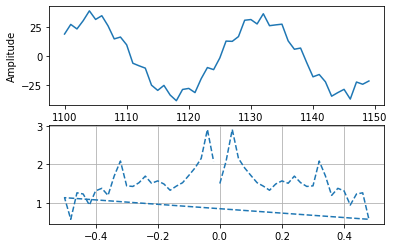

Machine Operating in Normal Mode


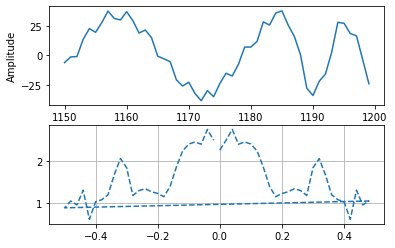

MACHINE IN FAULTY MODE!!!


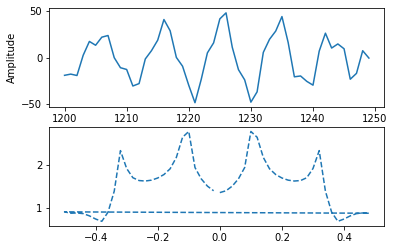

In [51]:
window = 50
column = '0'
file_name = 'machine_7.csv'
ranger = run_frequency_plot(file_name, window, column)

In [52]:
print(f'Machine enters Faulty mode in the range: {ranger[0]}')

dates = pd.date_range(start=ranger[1].index[0], periods=ranger[0][0] + 150, freq='8H')
print(f'Machine enters Faulty mode around: {dates[ranger[0][0]]}')

print(f'Expect Machine to die after: {dates[-1]}')

Machine enters Faulty mode in the range: (1200, 1250)
Machine enters Faulty mode around: 2020-02-05 00:00:00
Expect Machine to die after: 2020-03-25 16:00:00


### Conclusion

The dataset is quite noisy, but handelling outliers is an easy part.
We can use just the analytical approach to create an Upper and Lower Bound on the dataset and say that the machine enters the faulty mode when it crosses that threshold.
When sensor shows 0 as output, the sensor has entered the dead mode.

Another method, and the most effective so far, is the use of frequency domain. Check the frequency of the wave and when we note a change in prominent frequency of the input, we can say that sensor has entered into the faulty mode.

The more effective method is using Time Series Analysis, but in this case it wasn't so effective.
FBProphet can be used to visuallize the dataset, however, it doesn't consider hourly dataset. 
Prophet is a procedure for forecasting time series data based on an additive model where non-linear trends are fit with yearly, weekly, and daily seasonality, plus holiday effects. It works best with time series that have strong seasonal effects and several seasons of historical data. Prophet is robust to missing data and shifts in the trend, and typically handles outliers well.

Lastly I used LSTM to model the data. It was quite faster and with Neural Network in place, it is less prone to errors.
Using the same window method to pinpoint when the machine enters into faulty mode.

For predicting the point where sensor dies, I took analytical approach again and figured that roughly after 150 timestamps (1200 hours) after it was detected as faulty, the sensor dies.